In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import tarfile

my_tar = tarfile.open('/content/drive/MyDrive/Task06_Lung.tar')
my_tar.extractall('./my_folder') # specify which folder to extract to
my_tar.close()

/tmp/ipython-input-1948887902.py:4: DeprecationWarning: Python 3.14 will, by default, filter extracted tar archives and reject files or modify their metadata. Use the filter argument to control this behavior.
  my_tar.extractall('./my_folder') # specify which folder to extract to


In [ ]:
!pip install celluloid
!pip install numpy==1.26.4

In [ ]:
%matplotlib notebook
from pathlib import Path
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt
from celluloid import Camera
from tqdm.notebook import tqdm
import cv2

In [ ]:
def change_img_to_label_path(path):
    """
    Replaces imagesTr with labelsTr
    """
    parts = list(path.parts)  # get all directories whithin the path
    parts[parts.index("imagesTr")] = "labelsTr"  # Replace imagesTr with labelsTr
    return Path(*parts)  # Combine list back into a Path object

In [ ]:

# Inspect some sample data
root = Path("/content/my_folder/Task06_Lung/imagesTr")
label = Path("/content/my_folder/Task06_Lung/labelsTr/")

sample_path = list(root.glob("lung*"))[9]  # Choose a subject
sample_path_label = change_img_to_label_path(sample_path)

print(sample_path)
print(sample_path_label)

/content/my_folder/Task06_Lung/imagesTr/lung_080.nii.gz
/content/my_folder/Task06_Lung/labelsTr/lung_080.nii.gz


In [ ]:
# Load NIfTI and extract image data
data = nib.load(sample_path)
label = nib.load(sample_path_label)

ct = data.get_fdata()
mask = label.get_fdata()

print(mask.shape)

(512, 512, 450)


In [ ]:
# Find out the orientation
nib.aff2axcodes(data.affine)

('L', 'A', 'S')

In [ ]:
# Inspect the loaded data with overlaid Ground Truth tumor segmentation using axial view
fig = plt.figure()
camera = Camera(fig)  # create the camera object from celluloid

for i in range(0, ct.shape[2], 2):  # axial view
    plt.imshow(ct[:,:,i], cmap="bone")
    mask_ = np.ma.masked_where(mask[:,:,i]==0, mask[:,:,i])
    plt.imshow(mask_, alpha=0.5, cmap="autumn")
    #plt.axis("off")
    camera.snap()  # Store the current slice

animation = camera.animate()  # create the animation

<IPython.core.display.Javascript object>

In [ ]:
from IPython.display import HTML
HTML(animation.to_html5_video())  # convert the animation to a video

In [ ]:
root = Path("/content/my_folder/Task06_Lung/imagesTr")
label = Path("/content/my_folder/Task06_Lung/labelsTr/")

all_files = list(root.glob("lung_*"))  # Get all subjects
all_files.sort()

print(all_files[3])
print(len(all_files))

/content/my_folder/Task06_Lung/imagesTr/lung_005.nii.gz
63


In [ ]:
# Create train directories for saving images and masks

save_root = Path("/content/my_folder/Task06_Lung/Preprocessed")

train_slice_path = save_root/"train"/"data"
train_mask_path = save_root/"train"/"masks"

train_slice_path.mkdir(parents=True, exist_ok=True)
train_mask_path.mkdir(parents=True, exist_ok=True)

In [ ]:
all_data = []
all_lables = []

counter = 0 # for naming files

for _ , path_to_ct_data in enumerate(tqdm(all_files)):

    path_to_label = change_img_to_label_path(path_to_ct_data)  # Get path to ground truth

    # Load and extract corresponding data
    ct_data = nib.load(path_to_ct_data).get_fdata()
    label_data = nib.load(path_to_label).get_fdata()

    # Crop volume and label. Remove the first 30 slices
    ct_data = ct_data[:,:,30:] / 3071
    new_label_data = label_data[:,:,30:]

    # Loop over the slices in the full volume and store the data and labels in the data/masks directory
    # Save all filenames in all_data and whether it has tumor or not in all_lables
    for i in range(ct_data.shape[-1]):
        slice = ct_data[:,:,i]
        mask = new_label_data[:,:,i]

        # Resize slice and label to common resolution to reduce training time
        slice = cv2.resize(slice, (256, 256))
        mask = cv2.resize(mask, (256, 256), interpolation=cv2.INTER_NEAREST)

        # Generate name of slice and its corresponding mask
        slice_name = f'slice_000000{100000+counter}'
        mask_name = f'mask_000000{100000+counter}'

        # Save filenames and classification label of slice in for train_test spliting later
        all_data.append(np.array([slice_name,mask_name]))
        all_lables.append(mask.any())

        counter += 1
        np.save(train_slice_path/slice_name, slice, allow_pickle=True)
        np.save(train_mask_path/mask_name, mask, allow_pickle=True)

  0%|          | 0/63 [00:00<?, ?it/s]

In [ ]:
all_data_np = np.array(all_data)
all_lables_np = np.array(all_lables)

print(all_data_np.shape)
print(all_lables_np.shape)

# This shows distribution of classification label (number of non-tumor slices vs. tumor slices).
print(np.unique(all_lables_np, return_counts=True))

(15767, 2)
(15767,)
(array([False,  True]), array([14121,  1646]))


In [ ]:
from sklearn.model_selection import train_test_split

# Splitting data to train and test
# If we activate stratify as input, the train and test datasets will have same
# distribution for tumor slices.
X_train, X_test, y_train, y_test = train_test_split(
                all_data_np,
                all_lables_np,
                test_size=0.2,
                random_state=13,
                # stratify = all_lables_np,
                )

print("Shape of training set:", X_train.shape)
print("Shape of test set:", X_test.shape)

print(np.unique(y_train, return_counts=True))
print(np.unique(y_test, return_counts=True))

Shape of training set: (12613, 2)
Shape of test set: (3154, 2)
(array([False,  True]), array([11255,  1358]))
(array([False,  True]), array([2866,  288]))


In [ ]:
# Now that we know which slices belong to validation we can move them in their own directory

val_slice_path = save_root/"val"/"data"
val_mask_path = save_root/"val"/"masks"

val_slice_path.mkdir(parents=True, exist_ok=True)
val_mask_path.mkdir(parents=True, exist_ok=True)

In [ ]:
for test in X_test:
    Path(rf'{train_slice_path}/{test[0]}.npy').replace(rf'{val_slice_path}/{test[0]}.npy')
    Path(rf'{train_mask_path}/{test[1]}.npy').replace(rf'{val_mask_path}/{test[1]}.npy')

In [ ]:
tumor_slice_idxs = []
for i in range (y_test.shape[0]):
    if y_test[i]:
        tumor_slice_idxs.append(i)

print(tumor_slice_idxs)

[19, 31, 35, 42, 43, 50, 69, 72, 85, 86, 97, 104, 120, 142, 157, 161, 190, 208, 214, 222, 224, 227, 246, 249, 251, 255, 266, 267, 302, 337, 354, 355, 375, 392, 402, 407, 409, 412, 414, 415, 438, 444, 501, 530, 532, 543, 562, 590, 591, 594, 604, 608, 622, 640, 642, 647, 653, 658, 663, 680, 681, 687, 692, 694, 697, 724, 726, 731, 747, 753, 757, 767, 768, 802, 810, 845, 860, 874, 875, 899, 900, 908, 946, 949, 960, 963, 971, 973, 976, 983, 987, 988, 1041, 1043, 1045, 1050, 1085, 1096, 1103, 1112, 1127, 1138, 1164, 1175, 1190, 1195, 1212, 1219, 1222, 1231, 1233, 1252, 1256, 1265, 1278, 1298, 1301, 1302, 1311, 1329, 1337, 1342, 1353, 1372, 1384, 1393, 1413, 1416, 1425, 1428, 1430, 1465, 1472, 1483, 1488, 1511, 1538, 1540, 1546, 1566, 1591, 1592, 1611, 1624, 1633, 1636, 1644, 1675, 1680, 1694, 1705, 1723, 1725, 1738, 1740, 1742, 1754, 1759, 1763, 1813, 1854, 1872, 1877, 1884, 1894, 1901, 1910, 1937, 1985, 1986, 1990, 1995, 2015, 2016, 2020, 2022, 2030, 2033, 2045, 2050, 2051, 2081, 2091, 2108

In [ ]:
test = X_test[2683]

slice_path = Path(val_slice_path/test[0])
mask_path = Path(val_mask_path/test[1])

# Choose a file and load slice + mask
slice = np.load(str(slice_path) + '.npy')
mask = np.load(str(mask_path) + '.npy')

print(slice.shape)
print(slice.min(), slice.max())

(256, 256)
-0.33344187561055033 0.619993487463367


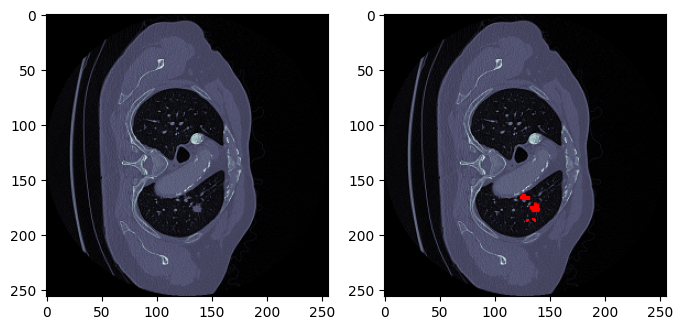

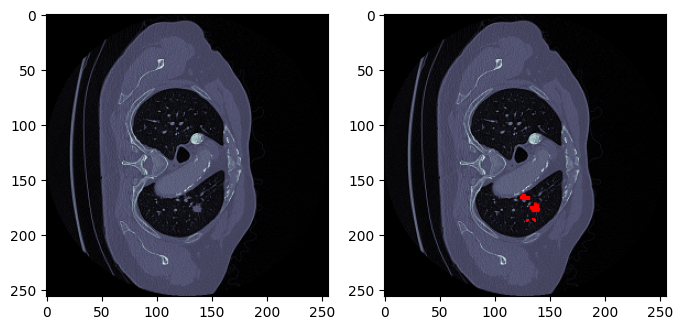

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

%matplotlib inline
fig, axis = plt.subplots(1, 2, figsize=(8, 8))
axis[0].imshow(slice, cmap="bone")
mask_ = np.ma.masked_where(mask==0, mask)
axis[1].imshow(slice, cmap="bone")
axis[1].imshow(mask_, cmap="autumn")


In [ ]:
!pip install pytorch_lightning
!pip install imgaug

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 831.6/831.6 kB 25.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.2/983.2 kB 68.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 948.0/948.0 kB 18.3 MB/s eta 0:00:00


In [ ]:
from pathlib import Path

import torch
import pytorch_lightning as pl
from pytorch_lightning.callbacks import ModelCheckpoint
from pytorch_lightning.loggers import TensorBoardLogger
import imgaug
import imgaug.augmenters as iaa
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from celluloid import Camera
from imgaug.augmentables.segmaps import SegmentationMapsOnImage

### Dataset Creation

In [ ]:
class LungDataset(torch.utils.data.Dataset):
    def __init__(self, root, augment_params):
        self.all_files = self.extract_files(root)
        self.augment_params = augment_params

    @staticmethod
    def extract_files(root):
        """
        Extract the paths to all slices given the root path (ends with train or val)
        """
        files = []
        slice_path = root/"data"  # Get the slices for current subject
        for slice in slice_path.glob("*"):
            files.append(slice)
        return files

    @staticmethod
    def change_img_to_label_path(path):
        """
        Replace data with mask to get the masks
        """
        parts = list(path.parts)
        parts[-2] = "masks"
        parts[-1] = parts[-1].replace('slice','mask')
        return Path(*parts)

    def augment(self, slice, mask):
        """
        Augments slice and segmentation mask in the exact same way
        Note the manual seed initialization
        """
        ###################IMPORTANT###################
        # Fix for https://discuss.pytorch.org/t/dataloader-workers-generate-the-same-random-augmentations/28830/2
        random_seed = torch.randint(0, 1000000, (1,))[0].item()
        imgaug.seed(random_seed)
        #####################################################

        new_mask = mask.astype(bool)

        mask = SegmentationMapsOnImage(new_mask, new_mask.shape)
        slice_aug, mask_aug = self.augment_params(image=slice, segmentation_maps=mask)
        mask_aug = mask_aug.get_arr()
        return slice_aug, mask_aug

    def __len__(self):
        """
        Return the length of the dataset (length of all files)
        """
        return len(self.all_files)

    def __getitem__(self, idx):
        """
        Given an index return the (augmented) slice and corresponding mask
        Add another dimension for pytorch
        """
        file_path = self.all_files[idx]
        mask_path = self.change_img_to_label_path(file_path)
        slice = np.load(file_path)
        mask = np.load(mask_path)

        if self.augment_params:
            slice, mask = self.augment(slice, mask)
        return np.expand_dims(slice, 0), np.expand_dims(mask, 0)


In [ ]:
seq = iaa.Sequential([
    iaa.Affine(translate_percent=(0.15),
               scale=(0.85, 1.15), # zoom in or out
               rotate=(-45, 45)#
               ),  # rotate up to 45 degrees
    iaa.ElasticTransformation()  # Elastic Transformations
                ])


In [ ]:
# Create the dataset objects
train_path = Path("/content/my_folder/Task06_Lung/Preprocessed/train/")
val_path = Path("/content/my_folder/Task06_Lung/Preprocessed/val/")

train_dataset = LungDataset(train_path, seq)
val_dataset = LungDataset(val_path, None)

print(f"There are {len(train_dataset)} train images and {len(val_dataset)} val images")

There are 12613 train images and 3154 val images


### Oversampling to tackle strong class imbalance
Lung tumors are often very small, thus we need to make sure that our model does not learn a trivial solution which simply outputs 0 for all voxels.<br />
So, we will use oversampling to sample slices which contain a tumor more often.

In [ ]:
# create a list containing only the class labels
target_list = []
for _, label in tqdm(train_dataset):
    # Check if mask contains a tumorous pixel:
    if np.any(label):
        target_list.append(1)
    else:
        target_list.append(0)

  0%|          | 0/12613 [00:00<?, ?it/s]

In [ ]:
# calculate the weight for each class
uniques = np.unique(target_list, return_counts=True)
print(uniques)

fraction = uniques[1][0] / uniques[1][1]
print(fraction)

(array([0, 1]), array([11257,  1356]))
8.301622418879056


In [ ]:
weight_list = []

for target in target_list:
    if target == 0:
        weight_list.append(1)
    else:
        weight_list.append(fraction)

print(weight_list[:50])

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 8.301622418879056, 1, 1, 1, 8.301622418879056, 1, 1, 1, 1, 1, 1, 1, 1, 8.301622418879056, 1, 1, 1, 1, 1, 1, 8.301622418879056, 1, 1, 1, 8.301622418879056, 1, 1, 1, 1, 1, 1, 1, 1, 1, 8.301622418879056, 8.301622418879056, 1, 1]


In [ ]:
# Finally we create the sampler which we can pass to the DataLoader.
sampler = torch.utils.data.sampler.WeightedRandomSampler(weight_list, len(weight_list))


In [ ]:
batch_size = 8
num_workers = 2


train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size,
                                           num_workers=num_workers, sampler=sampler)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=batch_size, num_workers=num_workers, shuffle=False)


### Loss

As this is a harder task to train we might try different loss functions:
We achieved best results by using the Binary Cross Entropy instead of the Dice Loss

In [ ]:
class DoubleConv(torch.nn.Module):
    """
    Helper Class which implements the intermediate Convolutions
    """
    def __init__(self, in_channels, out_channels):

        super().__init__()
        self.step = torch.nn.Sequential(torch.nn.Conv2d(in_channels, out_channels, 3, padding=1),
                                        torch.nn.ReLU(),
                                        torch.nn.Conv2d(out_channels, out_channels, 3, padding=1),
                                        torch.nn.ReLU())

    def forward(self, X):
        return self.step(X)


In [ ]:
class UNet(torch.nn.Module):
    """
    This class implements a UNet for the Segmentation
    We use 3 down- and 3 UpConvolutions and two Convolutions in each step
    """

    def __init__(self):
        """Sets up the U-Net Structure
        """
        super().__init__()


        ############# DOWN #####################
        self.layer1 = DoubleConv(1, 64)
        self.layer2 = DoubleConv(64, 128)
        self.layer3 = DoubleConv(128, 256)
        self.layer4 = DoubleConv(256, 512)

        #########################################

        ############## UP #######################
        self.layer5 = DoubleConv(512 + 256, 256)
        self.layer6 = DoubleConv(256+128, 128)
        self.layer7 = DoubleConv(128+64, 64)
        self.layer8 = torch.nn.Conv2d(64, 1, 1)
        #########################################

        self.maxpool = torch.nn.MaxPool2d(2)

    def forward(self, x):

        ####### DownConv 1#########
        x1 = self.layer1(x)
        x1m = self.maxpool(x1)
        ###########################

        ####### DownConv 2#########
        x2 = self.layer2(x1m)
        x2m = self.maxpool(x2)
        ###########################

        ####### DownConv 3#########
        x3 = self.layer3(x2m)
        x3m = self.maxpool(x3)
        ###########################

        ##### Intermediate Layer ##
        x4 = self.layer4(x3m)
        ###########################

        ####### UpCONV 1#########
        x5 = torch.nn.Upsample(scale_factor=2, mode="bilinear")(x4)  # Upsample with a factor of 2
        #x5 = torch.nn.ConvTranspose2d(512, 512, 2, 2)(x4)
        x5 = torch.cat([x5, x3], dim=1)  # Skip-Connection
        x5 = self.layer5(x5)
        ###########################

        ####### UpCONV 2#########
        x6 = torch.nn.Upsample(scale_factor=2, mode="bilinear")(x5)
        #x6 = torch.nn.ConvTranspose2d(256, 256, 2, 2)(x5)
        x6 = torch.cat([x6, x2], dim=1)  # Skip-Connection
        x6 = self.layer6(x6)
        ###########################

        ####### UpCONV 3#########
        x7 = torch.nn.Upsample(scale_factor=2, mode="bilinear")(x6)
        #x7 = torch.nn.ConvTranspose2d(128, 128, 2, 2)(x6)
        x7 = torch.cat([x7, x1], dim=1)
        x7 = self.layer7(x7)
        ###########################

        ####### Predicted segmentation#########
        ret = self.layer8(x7)
        return ret


In [ ]:
# Full Segmentation Model
class TumorSegmentation(pl.LightningModule):
    def __init__(self):
        super().__init__()

        self.model = UNet()

        self.optimizer = torch.optim.Adam(self.model.parameters(), lr=1e-4)
        self.loss_fn = torch.nn.BCEWithLogitsLoss()

    def forward(self, data):
        pred = self.model(data)
        return pred

    def training_step(self, batch, batch_idx):
        ct, mask = batch
        mask = mask.float()
        ct = ct.float()

        pred = self(ct)
        loss = self.loss_fn(pred, mask)

        # Logs
        self.log("Train Dice", loss)
        if batch_idx % 50 == 0:
            self.log_images(ct.cpu(), pred.cpu(), mask.cpu(), "Train")
        return loss


    def validation_step(self, batch, batch_idx):
        ct, mask = batch
        mask = mask.float()
        ct = ct.float()

        pred = self(ct)
        loss = self.loss_fn(pred, mask)

        # Logs
        self.log("Val Dice", loss)
        if batch_idx % 50 == 0:
            self.log_images(ct.cpu(), pred.cpu(), mask.cpu(), "Val")

        return loss


    def log_images(self, ct, pred, mask, name):

        results = []

        pred = pred > 0.5 # As we use the sigomid activation function, we threshold at 0.5


        fig, axis = plt.subplots(1, 2)
        axis[0].imshow(ct[0][0], cmap="bone")
        mask_ = np.ma.masked_where(mask[0][0]==0, mask[0][0])
        axis[0].imshow(mask_, alpha=0.6)
        axis[0].set_title("Ground Truth")

        axis[1].imshow(ct[0][0], cmap="bone")
        mask_ = np.ma.masked_where(pred[0][0]==0, pred[0][0])
        axis[1].imshow(mask_, alpha=0.6, cmap="autumn")
        axis[1].set_title("Pred")

        self.logger.experiment.add_figure(f"{name} Prediction vs Label", fig, self.global_step)



    def configure_optimizers(self):
        #We always need to return a list here (just pack our optimizer into one :))
        return [self.optimizer]



In [ ]:
# Instanciate the model
model = TumorSegmentation()

# Create the checkpoint callback
checkpoint_callback = ModelCheckpoint(
    monitor='Val Dice',
    save_top_k=30,
    mode='min')

# Create the trainer
trainer = pl.Trainer(accelerator="auto",
                     logger=TensorBoardLogger(save_dir="/content/drive/MyDrive/output"),
                     log_every_n_steps=1,
                     callbacks=checkpoint_callback,
                     max_epochs=5)


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


In [ ]:
trainer.fit(model, train_loader, val_loader,
            # ckpt_path = "/content/drive/MyDrive/output/lightning_logs/version_1/checkpoints/epoch=5-step=33117.ckpt"
            )

/usr/local/lib/python3.12/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:751: Checkpoint directory /content/drive/MyDrive/output/lightning_logs/version_1/checkpoints exists and is not empty.
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type              | Params | Mode 
------------------------------------------------------
0 | model   | UNet              | 7.8 M  | train
1 | loss_fn | BCEWithLogitsLoss | 0      | train
------------------------------------------------------
7.8 M     Trainable params
0         Non-trainable params
7.8 M     Total params
31.127    Total estimated model params size (MB)
46        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=5` reached.


In [ ]:
%reload_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/output/lightning_logs/

<IPython.core.display.Javascript object>

### Evaluation:
Let's evaluate the results

In [ ]:
class DiceScore(torch.nn.Module):
    """
    class to compute the Dice Loss
    """
    def __init__(self):
        super().__init__()

    def forward(self, pred, mask):

        #flatten label and prediction tensors
        pred = torch.flatten(pred)
        mask = torch.flatten(mask)

        counter = (pred * mask).sum()  # Counter
        denum = pred.sum() + mask.sum()  # denominator
        dice = (2*counter)/denum

        return dice


In [ ]:
!ls "/content/drive/MyDrive/output/lightning_logs/version_1/checkpoints"

'epoch=0-step=1577.ckpt'  'epoch=2-step=5289.ckpt'  'epoch=4-step=8443.ckpt'
'epoch=1-step=3154.ckpt'  'epoch=3-step=6866.ckpt'


In [ ]:
model = TumorSegmentation.load_from_checkpoint("/content/drive/MyDrive/output/lightning_logs/version_1/checkpoints/epoch=2-step=5289.ckpt",
                                               map_location=torch.device('cpu'))
model.eval();
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model.to(device);

In [ ]:
preds = []
labels = []

for slice, label in tqdm(val_dataset):
    slice = torch.tensor(slice).float().to(device).unsqueeze(0)
    with torch.no_grad():
        pred = torch.sigmoid(model(slice))
    preds.append(pred.cpu().numpy())
    labels.append(label)

preds = np.array(preds)
labels = np.array(labels)

  0%|          | 0/3154 [00:00<?, ?it/s]

In [ ]:
dice_score = DiceScore()(torch.from_numpy(preds), torch.from_numpy(labels).unsqueeze(0).float())
print(f"The Val Dice Score is: {dice_score}")

The Val Dice Score is: 0.5890956521034241


### Visualization


In [ ]:
import nibabel as nib
import cv2

In [ ]:
subject = Path("/content/my_folder/Task06_Lung/imagesTs/lung_091.nii.gz")
ct = nib.load(subject).get_fdata() / 3071  # standardize
ct = ct[:,:,30:]  # crop

In [ ]:
segmentation = []
label = []
scan = []
THRESHOLD = 0.5

for i in range(ct.shape[-1]):
    slice = ct[:,:,i]
    slice = cv2.resize(slice, (256, 256))
    slice = torch.tensor(slice)
    scan.append(slice)
    slice = slice.unsqueeze(0).unsqueeze(0).float().to(device)

    with torch.no_grad():
        pred = model(slice)[0][0].cpu()
    pred = pred > THRESHOLD
    segmentation.append(pred)
    label.append(segmentation)


In [ ]:
# Plotting the predicted segmentation (red)
%matplotlib notebook
fig = plt.figure()
camera = Camera(fig)  # create the camera object from celluloid

for i in range(0, len(scan), 2):  # Sagital view. Skip every second slice to reduce the video length
    plt.imshow(scan[i], cmap="bone")
    mask = np.ma.masked_where(segmentation[i]==0, segmentation[i])
    plt.imshow(mask, alpha=0.5, cmap="autumn")  # Use autumn colormap to get red segmentation

    plt.axis("off")
    camera.snap()  # Store the current slice
animation = camera.animate()  # create the animation

<IPython.core.display.Javascript object>

In [ ]:
from IPython.display import HTML
HTML(animation.to_html5_video())  # convert the animation to a video